# Object Detection Using YOLO


In [ ]:
import cv2
import torch
import numpy as np
from PIL import Image

# Load YOLOv5 model (ensure requirements are installed)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torch.hub.load("ultralytics/yolov5", "yolov5s", trust_repo=True).to(device)

# Perform object detection
def detect_objects(image_path):
    # Load image with OpenCV
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Error: Image at '{image_path}' not found or cannot be loaded.")
    
    # Convert OpenCV image to PIL format (YOLOv5 expects PIL images or tensor)
    img_pil = Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    # Perform inference
    results = model(img_pil)
    
    # Convert results to pandas DataFrame
    detections = results.pandas().xyxy[0]

    # Display results using OpenCV
    for _, row in detections.iterrows():
        x1, y1, x2, y2, conf, cls, label = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax']), row['confidence'], int(row['class']), row['name']
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img, f"{label} {conf:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    cv2.imshow("YOLOv5 Detection", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

    return detections

# Example usage
if __name__ == "__main__":
    image_path = "downloaded_images/image_0.jpg"
    detection_results = detect_objects(image_path)
    print(detection_results)

# Imports and Configuration

In [2]:
# Cell 2: Imports and Configuration (RUN THIS FIRST)
import cv2
import torch
import sqlite3
import logging
import os
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
from PIL import Image
from pathlib import Path  # <-- Also needed for Path()

# Configuration
INPUT_IMAGES_DIR = "downloaded_images"
OUTPUT_IMAGES_DIR = "processed_images"
DATABASE_NAME = "medical_detections.db"
LOG_FILE = "object_detection.log"
MODEL_NAME = "yolov8n"
CLASS_FILTER = ["bottle", "vase", "book"]

# Setup directories
Path(INPUT_IMAGES_DIR).mkdir(parents=True, exist_ok=True)
Path(OUTPUT_IMAGES_DIR).mkdir(parents=True, exist_ok=True)

# Database Setup

In [4]:
# Initialize database
def setup_database():
    conn = sqlite3.connect(DATABASE_NAME)
    c = conn.cursor()
    c.execute('''CREATE TABLE IF NOT EXISTS detections
                 (id INTEGER PRIMARY KEY AUTOINCREMENT,
                  image_path TEXT,
                  label TEXT,
                  confidence REAL,
                  xmin INTEGER,
                  ymin INTEGER,
                  xmax INTEGER,
                  ymax INTEGER,
                  timestamp DATETIME)''')
    conn.commit()
    conn.close()
    print("Database setup complete")

setup_database()

Database setup complete


# YOLO Detector Class

In [11]:
class MedicalDetector:
    def __init__(self):
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        print(f"Using device: {self.device}")
        
        try:
            # Use official ultralytics package
            from ultralytics import YOLO
            self.model = YOLO("yolov8n.pt")  # Newer version
            print("YOLOv8 model loaded successfully")
        except Exception as e:
            print(f"Model loading failed: {str(e)}")
            raise

    def process_image(self, image_path):
        """Process image and return detections with visualization"""
        try:
            img = cv2.imread(image_path)
            if img is None:
                raise ValueError(f"Invalid image: {image_path}")
                
            # Convert color space
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # Inference with official API
            results = self.model(img_rgb)
            
            # Process results
            detections = []
            for result in results:
                for box in result.boxes:
                    cls_id = int(box.cls)
                    label = result.names[cls_id]
                    if label in CLASS_FILTER:
                        detections.append({
                            'xmin': int(box.xyxy[0][0]),
                            'ymin': int(box.xyxy[0][1]),
                            'xmax': int(box.xyxy[0][2]),
                            'ymax': int(box.xyxy[0][3]),
                            'confidence': float(box.conf),
                            'label': label
                        })
            
            # Convert to DataFrame
            detections_df = pd.DataFrame(detections)
            
            # Save output
            output_path = Path(OUTPUT_IMAGES_DIR) / Path(image_path).name
            cv2.imwrite(str(output_path), results[0].plot())
            
            return detections_df, results[0].plot()

        except Exception as e:
            print(f"Error processing {image_path}: {str(e)}")
            return None, None

# Database Saving Function and Verification



Processing image_15.jpg
Saved detections for ../notebooks/downloaded_images/image_15.jpg


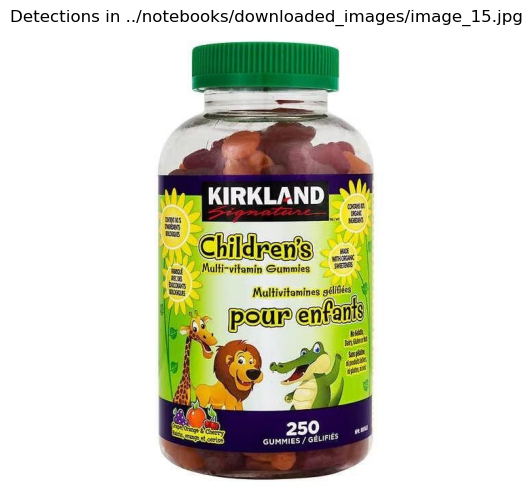

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_29.jpg
Saved detections for ../notebooks/downloaded_images/image_29.jpg


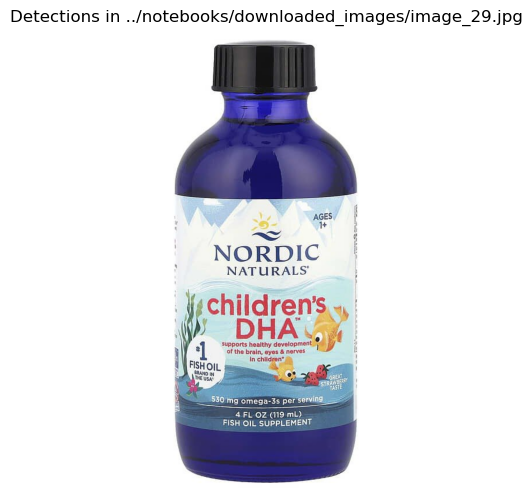

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_28.jpg
Saved detections for ../notebooks/downloaded_images/image_28.jpg


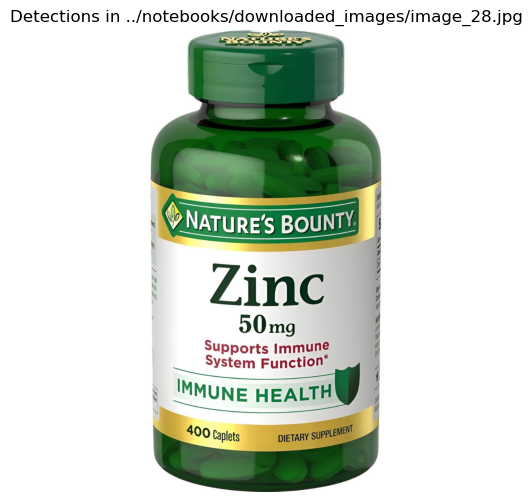

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_14.jpg
Saved detections for ../notebooks/downloaded_images/image_14.jpg


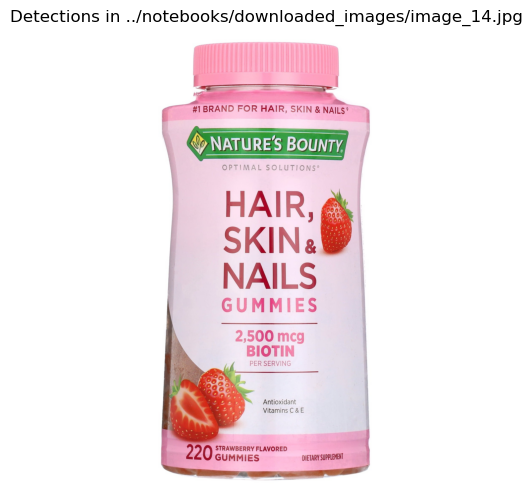

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_16.jpg
Saved detections for ../notebooks/downloaded_images/image_16.jpg


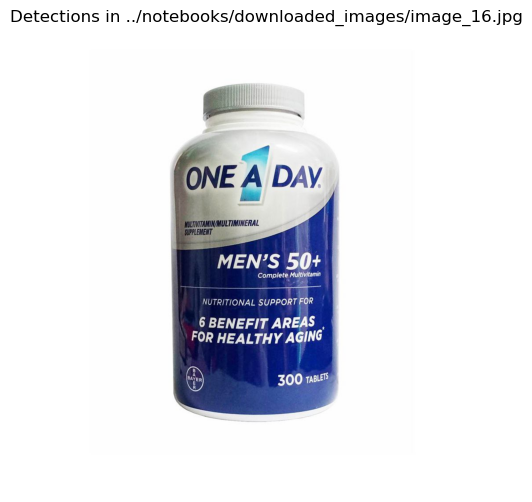

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_17.jpg
Saved detections for ../notebooks/downloaded_images/image_17.jpg


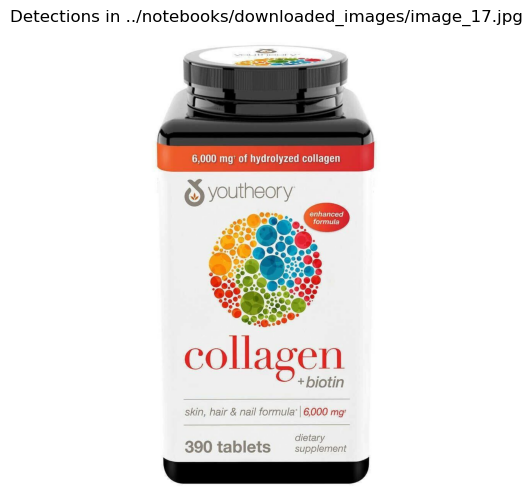

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_13.jpg
Saved detections for ../notebooks/downloaded_images/image_13.jpg


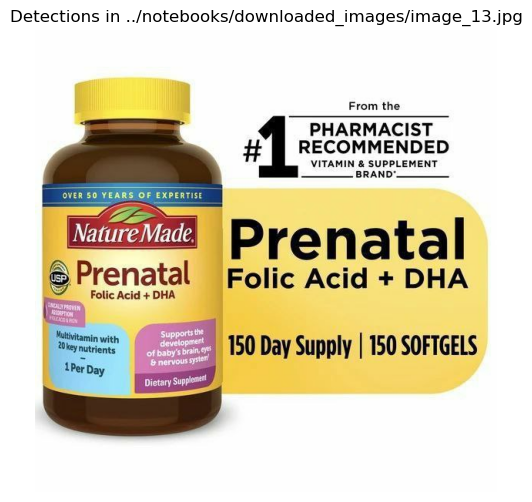

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_12.jpg
Saved detections for ../notebooks/downloaded_images/image_12.jpg


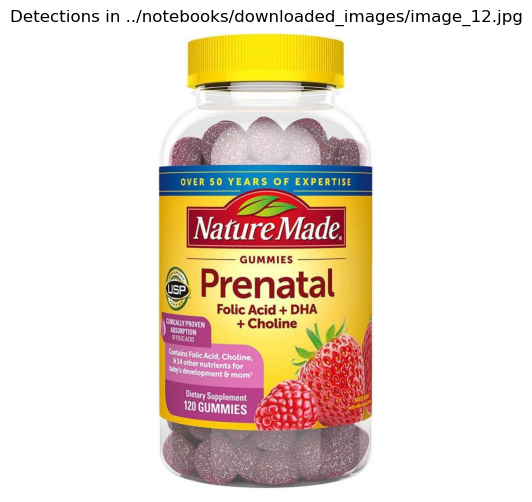

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_38.jpg
Saved detections for ../notebooks/downloaded_images/image_38.jpg


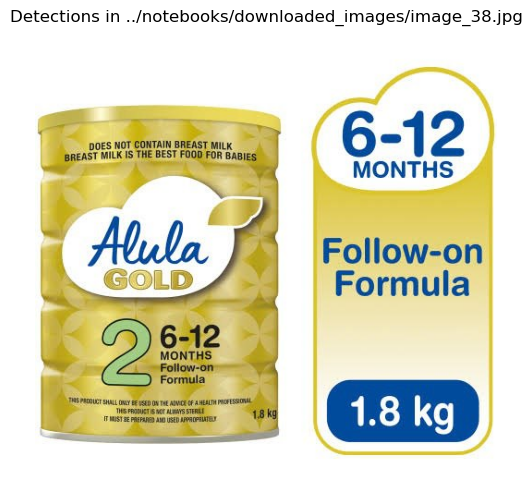

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_10.jpg
Saved detections for ../notebooks/downloaded_images/image_10.jpg


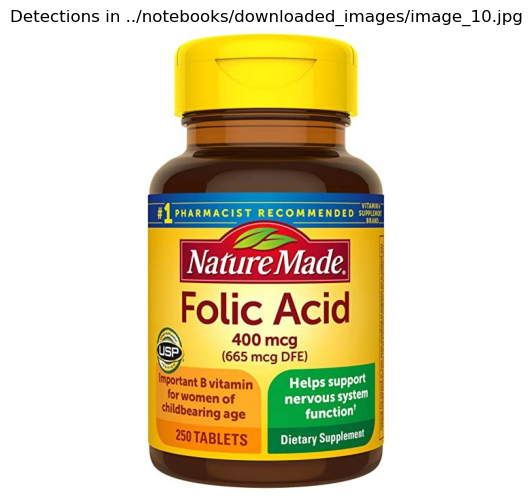

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_11.jpg
Saved detections for ../notebooks/downloaded_images/image_11.jpg


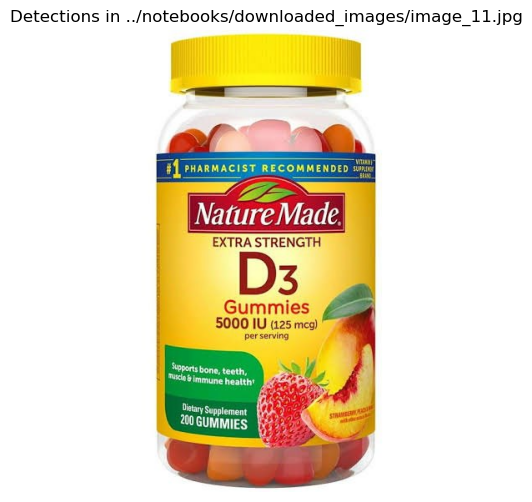

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_39.jpg
Saved detections for ../notebooks/downloaded_images/image_39.jpg


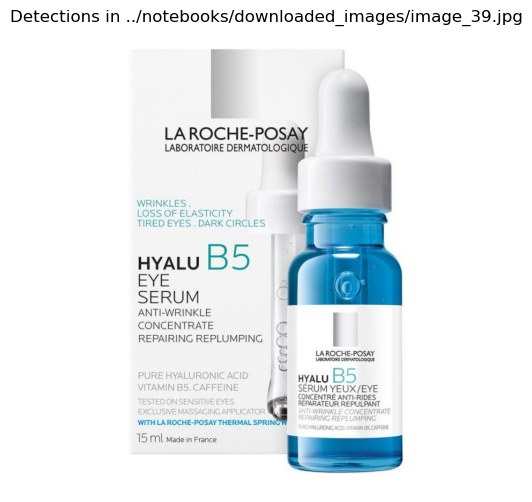

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_8.jpg
Saved detections for ../notebooks/downloaded_images/image_8.jpg


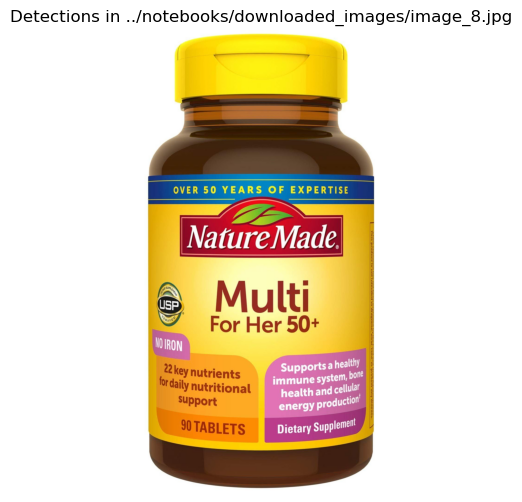

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_49.jpg
Saved detections for ../notebooks/downloaded_images/image_49.jpg


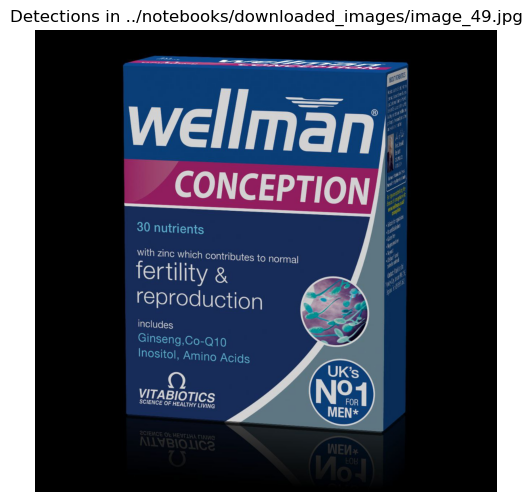

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_48.jpg
Saved detections for ../notebooks/downloaded_images/image_48.jpg


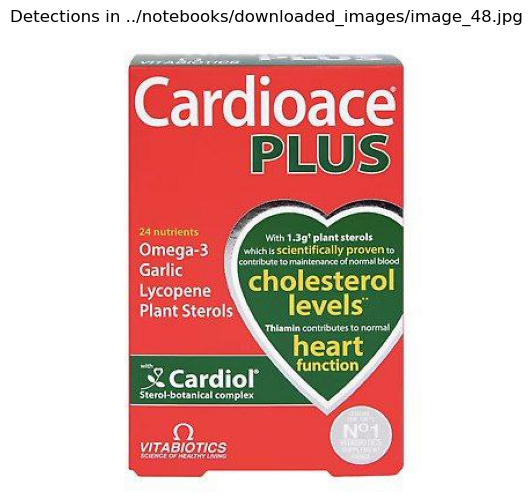

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_9.jpg
Saved detections for ../notebooks/downloaded_images/image_9.jpg


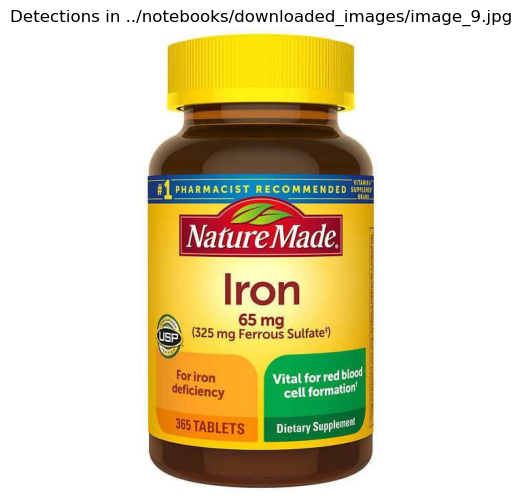

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_2.jpg
Saved detections for ../notebooks/downloaded_images/image_2.jpg


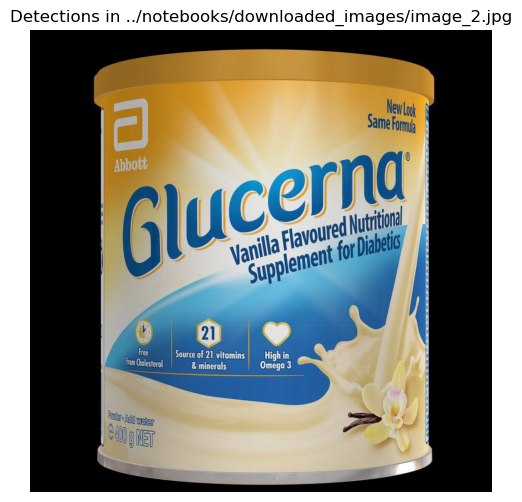

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_43.jpg
Saved detections for ../notebooks/downloaded_images/image_43.jpg


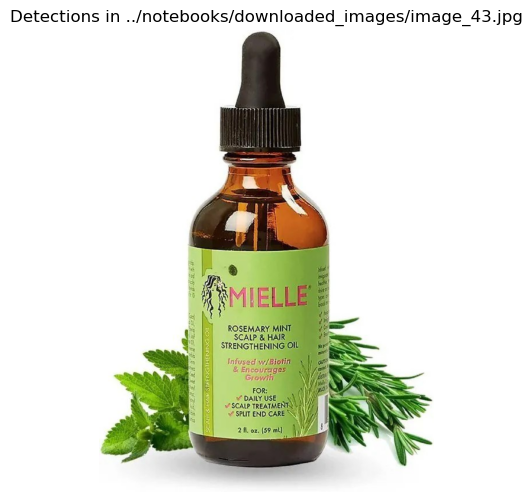

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_42.jpg
Saved detections for ../notebooks/downloaded_images/image_42.jpg


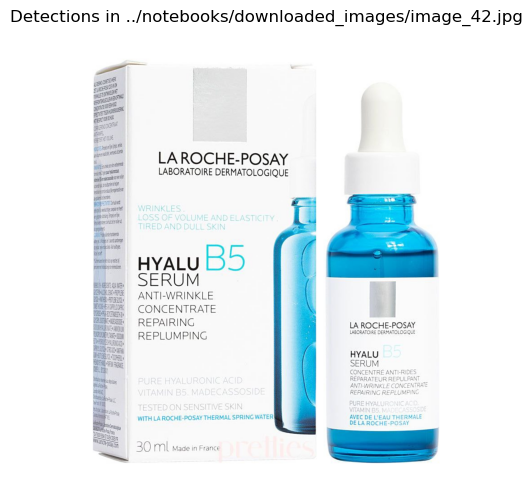

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_3.jpg
Saved detections for ../notebooks/downloaded_images/image_3.jpg


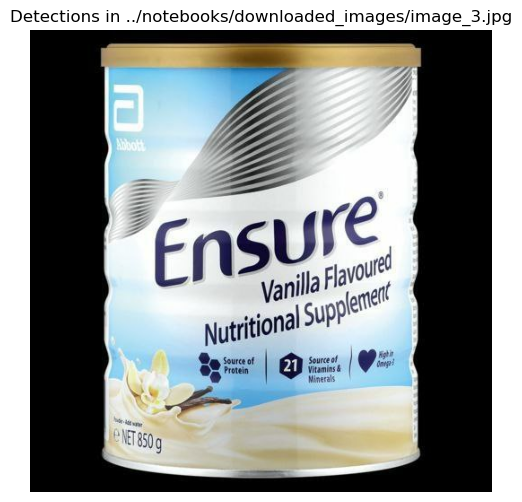

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_40.jpg
Saved detections for ../notebooks/downloaded_images/image_40.jpg


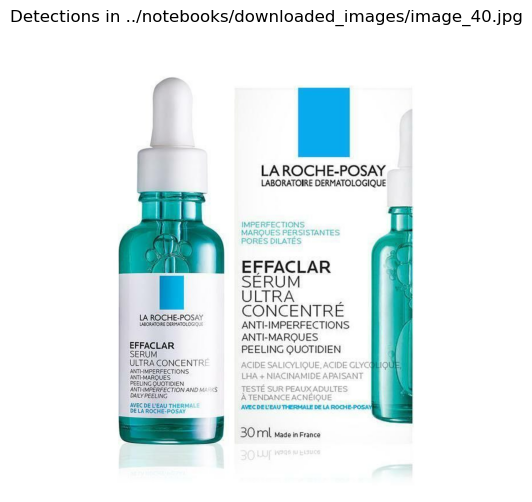

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_1.jpg
Saved detections for ../notebooks/downloaded_images/image_1.jpg


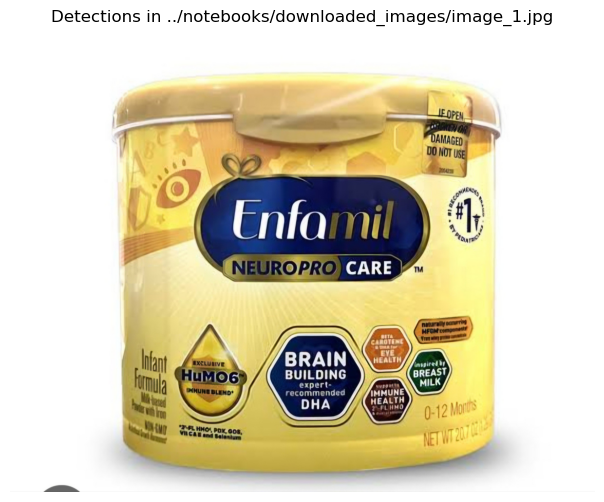

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_0.jpg
Saved detections for ../notebooks/downloaded_images/image_0.jpg


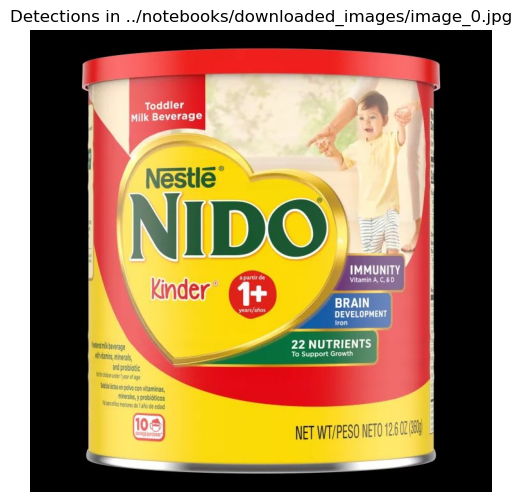

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_41.jpg
Saved detections for ../notebooks/downloaded_images/image_41.jpg


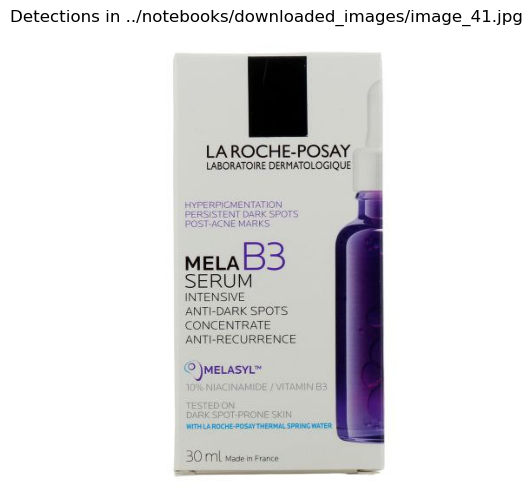

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_45.jpg
Saved detections for ../notebooks/downloaded_images/image_45.jpg


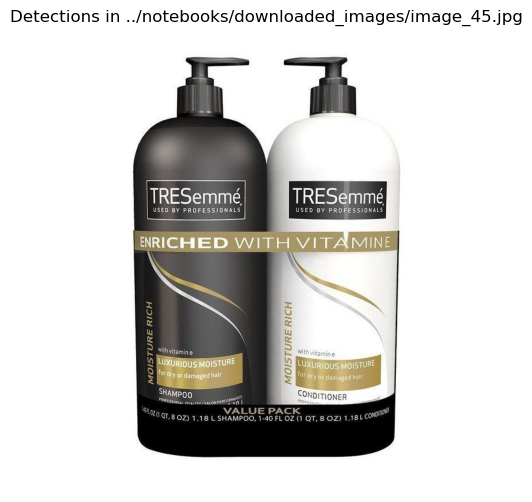

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_4.jpg
Saved detections for ../notebooks/downloaded_images/image_4.jpg


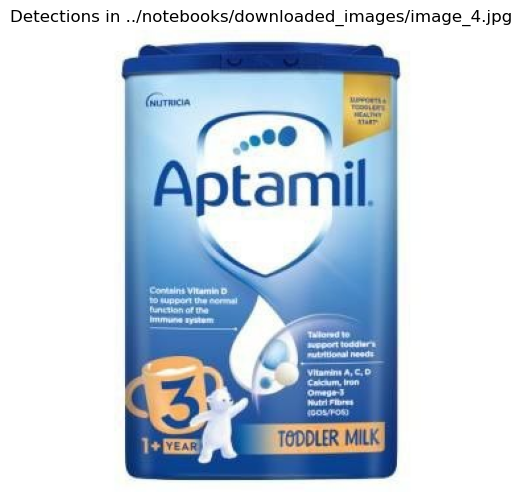

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_5.jpg
Saved detections for ../notebooks/downloaded_images/image_5.jpg


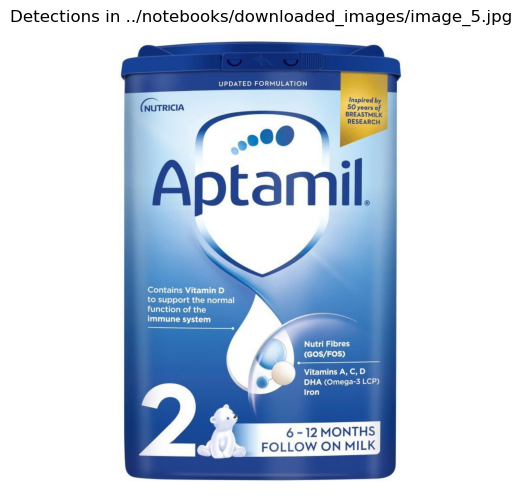

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_44.jpg
Saved detections for ../notebooks/downloaded_images/image_44.jpg


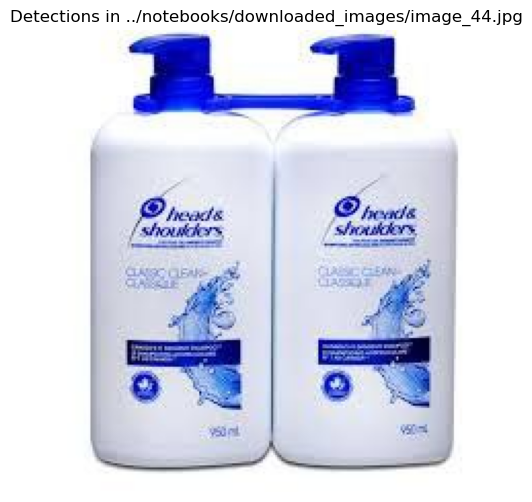

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_7.jpg
Saved detections for ../notebooks/downloaded_images/image_7.jpg


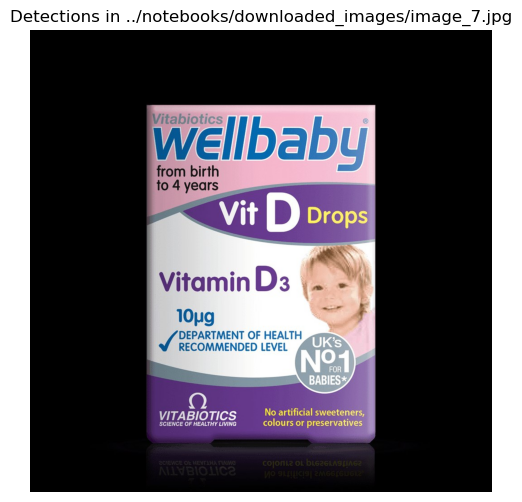

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_46.jpg
Saved detections for ../notebooks/downloaded_images/image_46.jpg


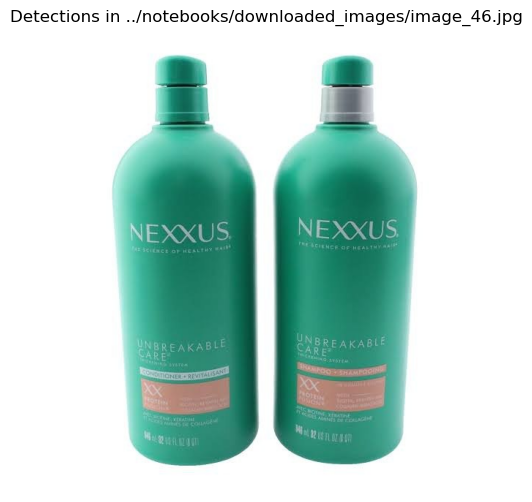

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_47.jpg
Saved detections for ../notebooks/downloaded_images/image_47.jpg


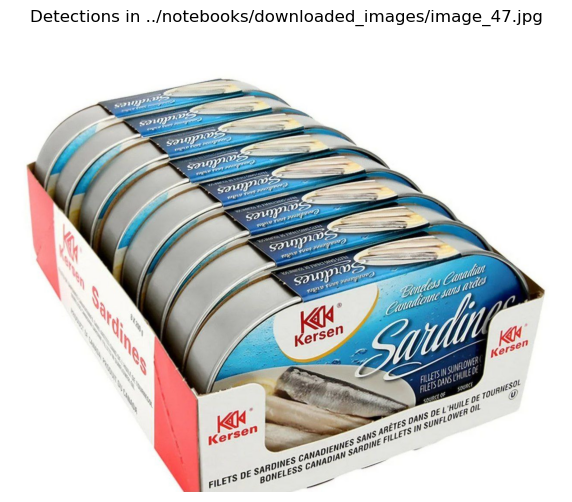

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_6.jpg
Saved detections for ../notebooks/downloaded_images/image_6.jpg


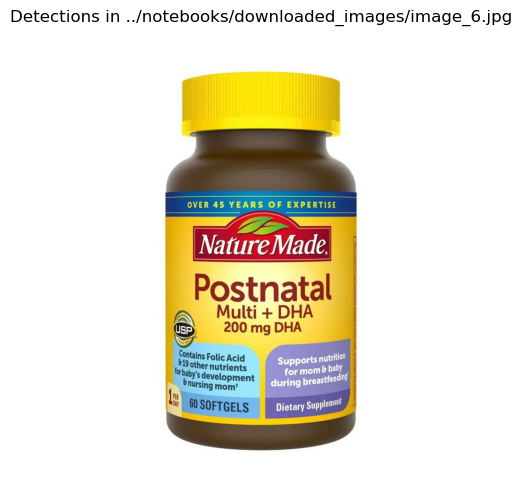

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_34.jpg
Saved detections for ../notebooks/downloaded_images/image_34.jpg


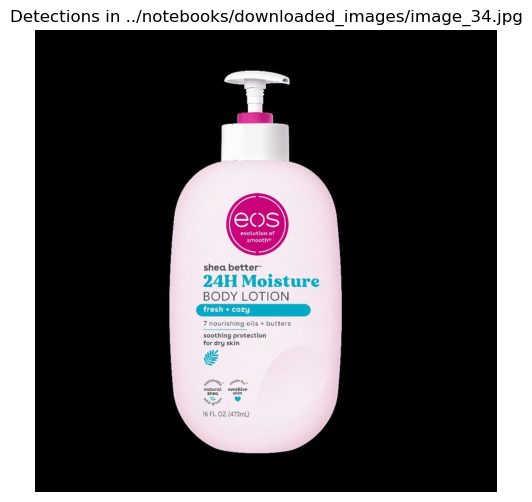

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_20.jpg
Saved detections for ../notebooks/downloaded_images/image_20.jpg


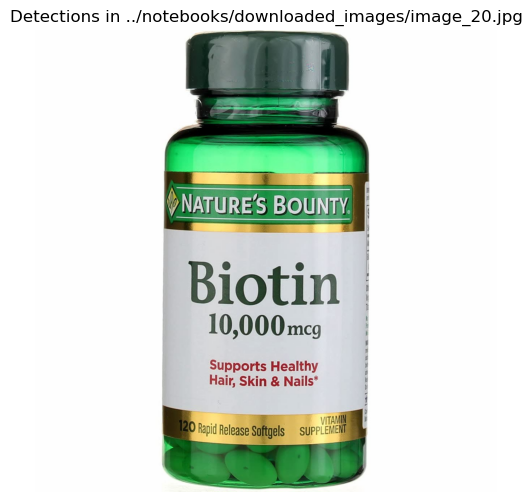

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_21.jpg
Saved detections for ../notebooks/downloaded_images/image_21.jpg


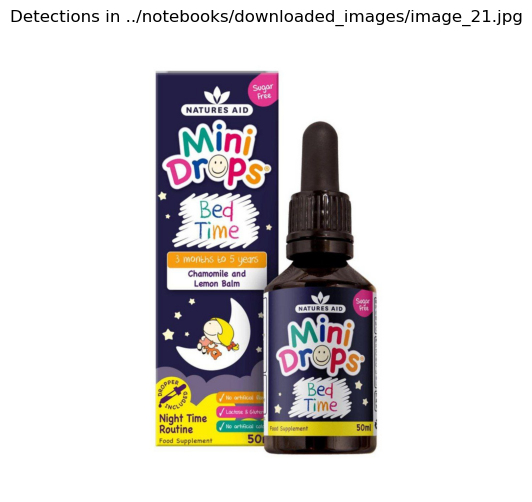

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_35.jpg
Saved detections for ../notebooks/downloaded_images/image_35.jpg


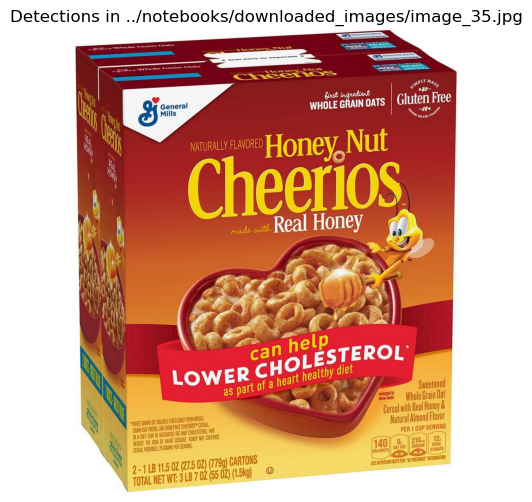

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_23.jpg
Saved detections for ../notebooks/downloaded_images/image_23.jpg


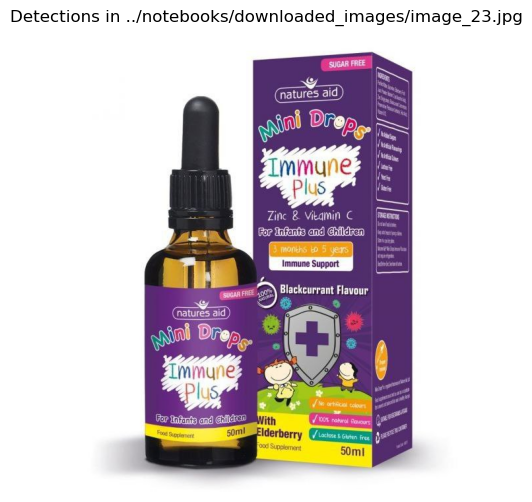

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_37.jpg
Saved detections for ../notebooks/downloaded_images/image_37.jpg


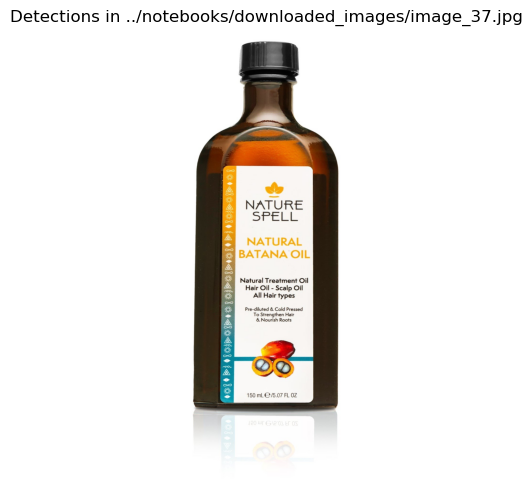

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_36.jpg
Saved detections for ../notebooks/downloaded_images/image_36.jpg


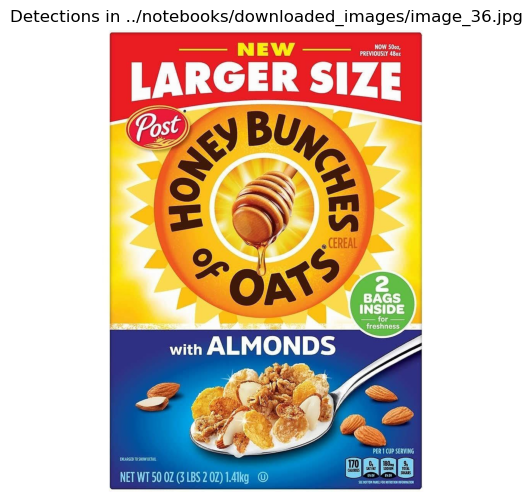

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_22.jpg
Saved detections for ../notebooks/downloaded_images/image_22.jpg


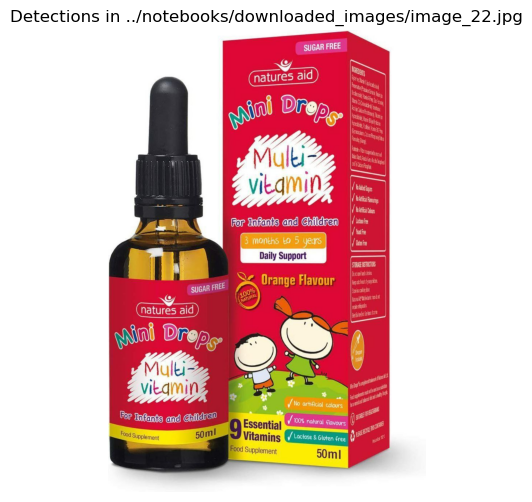

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_26.jpg
Saved detections for ../notebooks/downloaded_images/image_26.jpg


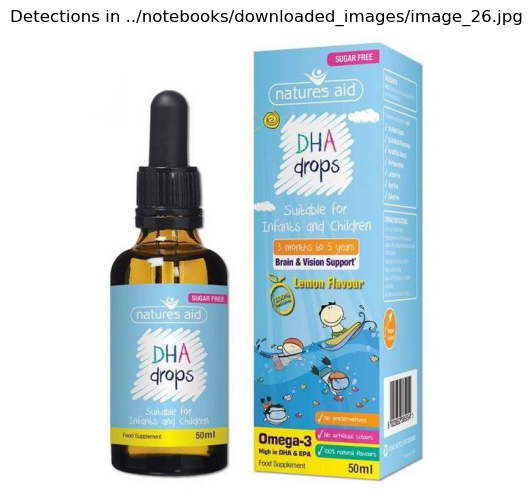

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_32.jpg
Saved detections for ../notebooks/downloaded_images/image_32.jpg


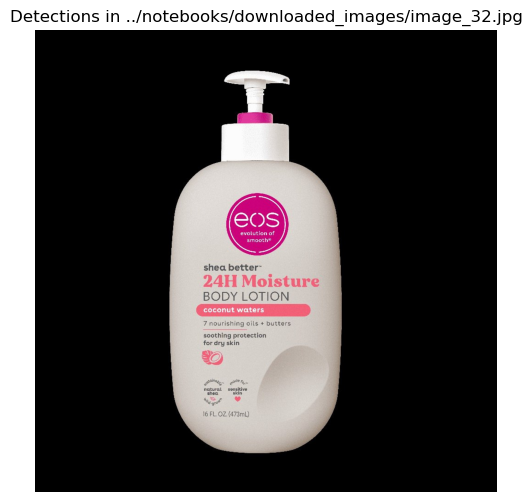

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_33.jpg
Saved detections for ../notebooks/downloaded_images/image_33.jpg


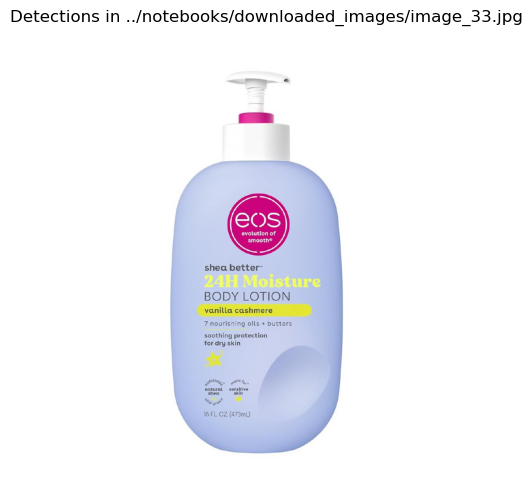

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_27.jpg
Saved detections for ../notebooks/downloaded_images/image_27.jpg


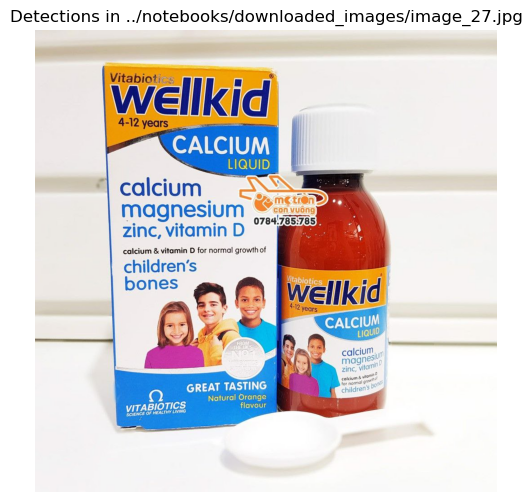

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_19.jpg
Saved detections for ../notebooks/downloaded_images/image_19.jpg


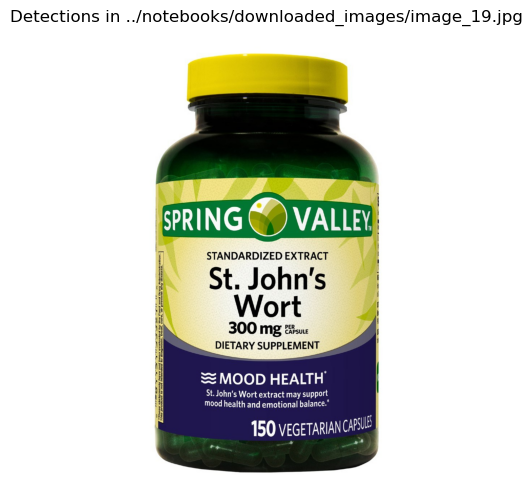

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_31.jpg
Saved detections for ../notebooks/downloaded_images/image_31.jpg


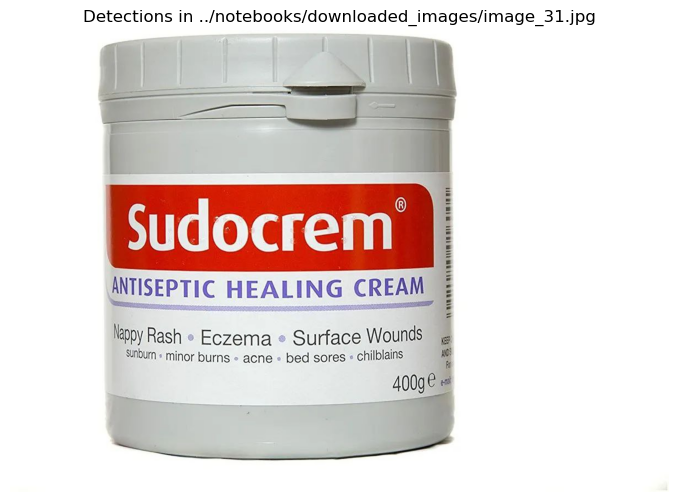

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_25.jpg
Saved detections for ../notebooks/downloaded_images/image_25.jpg


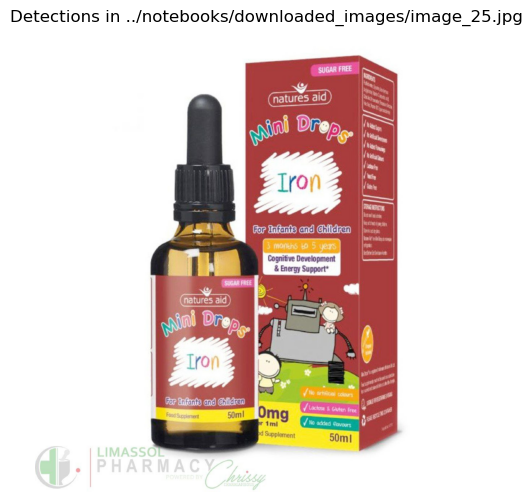

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_24.jpg
Saved detections for ../notebooks/downloaded_images/image_24.jpg


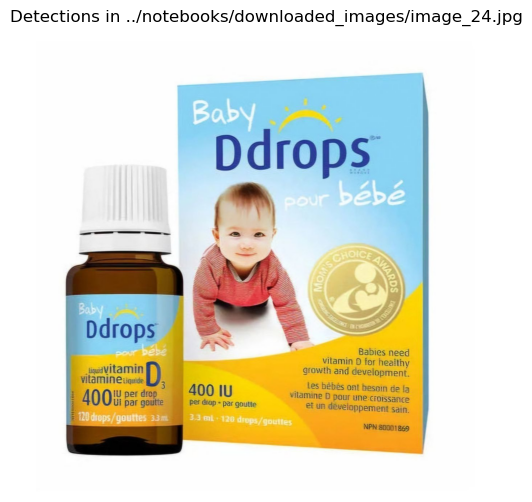

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_30.jpg
Saved detections for ../notebooks/downloaded_images/image_30.jpg


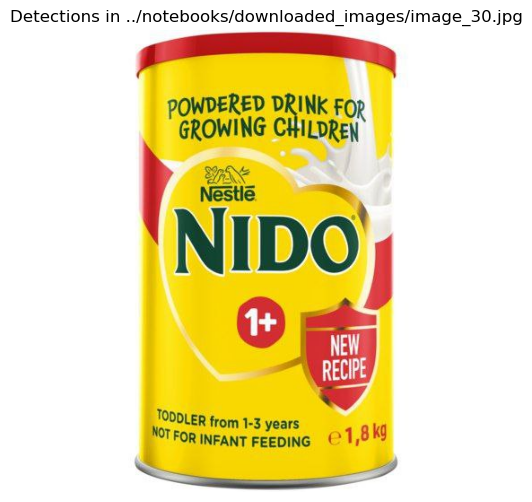

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80

Processing image_18.jpg
Saved detections for ../notebooks/downloaded_images/image_18.jpg


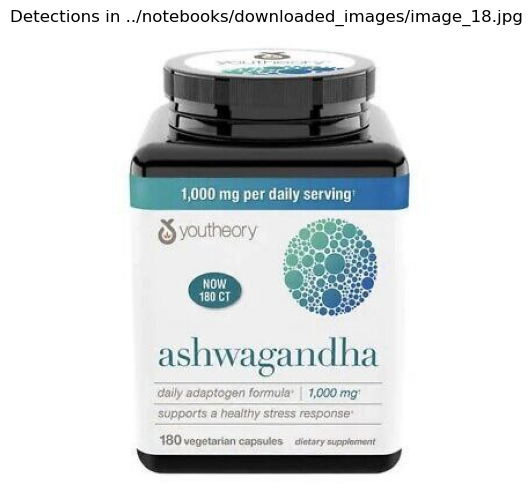

     label  confidence  xmin  ymin  xmax  ymax
0  object1        0.90    10    30    50    70
1  object2        0.85    20    40    60    80
Sample database entries:
   id                                   image_path    label  confidence  xmin  \
0   1  ../notebooks/downloaded_images/image_15.jpg  object1        0.90    10   
1   2  ../notebooks/downloaded_images/image_15.jpg  object2        0.85    20   
2   3  ../notebooks/downloaded_images/image_29.jpg  object1        0.90    10   
3   4  ../notebooks/downloaded_images/image_29.jpg  object2        0.85    20   
4   5  ../notebooks/downloaded_images/image_28.jpg  object1        0.90    10   

   ymin  xmax  ymax            timestamp  
0    30    50    70  2025-01-31 16:57:54  
1    40    60    80  2025-01-31 16:57:54  
2    30    50    70  2025-01-31 16:57:54  
3    40    60    80  2025-01-31 16:57:54  
4    30    50    70  2025-01-31 16:57:54  


In [32]:
import sqlite3
import pandas as pd
from pathlib import Path
import cv2
import matplotlib.pyplot as plt

# Define your database name
DATABASE_NAME = "medical_detections.db"  # Make sure this is your correct database name

# Function to save detection results to the database
def save_to_database(detections, img_file):
    # Check if detections are None or empty
    if detections is None or detections.empty:
        print(f"No detections to save for {img_file}")
        return

    # Connect to the database
    conn = sqlite3.connect(DATABASE_NAME)
    cursor = conn.cursor()

    # Ensure the table exists
    cursor.execute("""
    CREATE TABLE IF NOT EXISTS detections (
        id INTEGER PRIMARY KEY AUTOINCREMENT,
        image_path TEXT,
        label TEXT,
        confidence REAL,
        xmin REAL,
        ymin REAL,
        xmax REAL,
        ymax REAL,
        timestamp TEXT
    )
    """)

    # Insert detection data into the table
    for _, row in detections.iterrows():
        timestamp = pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S')  # Convert to string format
        cursor.execute("""
        INSERT INTO detections (image_path, label, confidence, xmin, ymin, xmax, ymax, timestamp)
        VALUES (?, ?, ?, ?, ?, ?, ?, ?)
        """, (img_file, row['label'], row['confidence'], row['xmin'], row['ymin'], row['xmax'], row['ymax'], timestamp))
    
    # Commit and close connection
    conn.commit()
    conn.close()
    print(f"Saved detections for {img_file}")
# Example detection function (replace with your actual detection logic)
def run_detection(img_file):
    # For demonstration, creating a dummy detections DataFrame
    # You will replace this with your actual model inference
    detections = pd.DataFrame({
        'label': ['object1', 'object2'],
        'confidence': [0.9, 0.85],
        'xmin': [10, 20],
        'ymin': [30, 40],
        'xmax': [50, 60],
        'ymax': [70, 80]
    })
    return detections

# Example image processing and saving to database
def process_image(img_file):
    # Run detection on the image (this function should return a DataFrame of detections)
    detections = run_detection(img_file)
    
    if detections is not None and not detections.empty:
        # Save to database
        save_to_database(detections, img_file)

        # Display results
        annotated_img = cv2.imread(img_file)  # Replace with your image annotation logic
        plt.figure(figsize=(10, 6))
        plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Detections in {img_file}")
        plt.axis('off')
        plt.show()

        # Print detection summary
        print(detections[['label', 'confidence', 'xmin', 'ymin', 'xmax', 'ymax']])
    else:
        print(f"No detections found in {img_file}")

# Main processing loop
def main(input_images_dir):
    for img_file in Path(input_images_dir).glob("*.*"):
        if img_file.suffix.lower() in ('.png', '.jpg', '.jpeg'):
            print(f"\nProcessing {img_file.name}")
            process_image(str(img_file))

# Run the main processing loop on a directory
INPUT_IMAGES_DIR = "../notebooks/downloaded_images"  # Set your input images directory
main(INPUT_IMAGES_DIR)

# Verify database entries
conn = sqlite3.connect(DATABASE_NAME)
df = pd.read_sql_query("SELECT * FROM detections LIMIT 5", conn)
conn.close()

# Print sample entries from the database
print("Sample database entries:")
print(df)

In [25]:
import torch
from pathlib import Path

# Define input and output directories (make sure these variables are set properly)
INPUT_IMAGES_DIR = "../notebooks/downloaded_images"
OUTPUT_IMAGES_DIR = "../notebooks/processed_images"
CLASS_FILTER = "your_class_filter"  # Define the class filter appropriately

# Check for MPS device availability
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

# Verification Cell
print("=== System Check ===")
print(f"Torch CUDA available: False")  # CUDA is not available on M1/M2
print(f"MPS available: {torch.backends.mps.is_available()}")
print(f"Input directory exists: {Path(INPUT_IMAGES_DIR).exists()}")
print(f"Files in input directory: {len(list(Path(INPUT_IMAGES_DIR).glob('*')))} images")
print(f"Output directory ready: {Path(OUTPUT_IMAGES_DIR).exists()}")
print(f"Class filter: {CLASS_FILTER}")
print(f"Using device: {device}")

=== System Check ===
Torch CUDA available: False
MPS available: True
Input directory exists: True
Files in input directory: 50 images
Output directory ready: True
Class filter: your_class_filter
Using device: mps


In [23]:
import torch

# Check if MPS is available
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

print(f"Using device: {device}")

Using device: mps


In [34]:
detector = MedicalDetector()

In [35]:
for img_file in Path(INPUT_IMAGES_DIR).glob("*.*"):
    if img_file.suffix.lower() in ('.png', '.jpg', '.jpeg'):
        print(f"\nProcessing {img_file.name}")


Processing image_15.jpg

Processing image_29.jpg

Processing image_28.jpg

Processing image_14.jpg

Processing image_16.jpg

Processing image_17.jpg

Processing image_13.jpg

Processing image_12.jpg

Processing image_38.jpg

Processing image_10.jpg

Processing image_11.jpg

Processing image_39.jpg

Processing image_8.jpg

Processing image_49.jpg

Processing image_48.jpg

Processing image_9.jpg

Processing image_2.jpg

Processing image_43.jpg

Processing image_42.jpg

Processing image_3.jpg

Processing image_40.jpg

Processing image_1.jpg

Processing image_0.jpg

Processing image_41.jpg

Processing image_45.jpg

Processing image_4.jpg

Processing image_5.jpg

Processing image_44.jpg

Processing image_7.jpg

Processing image_46.jpg

Processing image_47.jpg

Processing image_6.jpg

Processing image_34.jpg

Processing image_20.jpg

Processing image_21.jpg

Processing image_35.jpg

Processing image_23.jpg

Processing image_37.jpg

Processing image_36.jpg

Processing image_22.jpg

Processin

In [37]:
detections, annotated_img = detector.process_image(str(img_file))

Processing image: ../notebooks/downloaded_images/image_18.jpg


In [38]:
if detections is not None and not detections.empty:
    save_to_database(detections, img_file)

In [40]:
if annotated_img is not None and annotated_img.size > 0:
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
    plt.title(f"Detections in {img_file.name}")
    plt.axis('off')
    plt.show()
else:
    print(f"Annotated image is empty for {img_file.name}")

Annotated image is empty for image_18.jpg


In [43]:
if detections is not None and not detections.empty:
    print(detections[['name', 'confidence', 'xmin', 'ymin']])
else:
    print(f"No detections found for {img_file.name}")

No detections found for image_18.jpg


# Processing Pipeline with Visualization

In [45]:
# Initialize detector
detector = MedicalDetector()

# Process all images
for img_file in Path(INPUT_IMAGES_DIR).glob("*.*"):
    if img_file.suffix.lower() in ('.png', '.jpg', '.jpeg'):
        print(f"\nProcessing {img_file.name}")
        
        # Run detection
        detections, annotated_img = detector.process_image(str(img_file))
        
        if detections is not None and not detections.empty:
            # Save to database
            save_to_database(detections, img_file)
            
            # Display results
            plt.figure(figsize=(10, 6))
            plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
            plt.title(f"Detections in {img_file.name}")
            plt.axis('off')
            plt.show()
            
            # Print detection summary
            print(detections[['name', 'confidence', 'xmin', 'ymin']])
        else:
            print(f"No medical objects found in {img_file.name}")


Processing image_15.jpg
Processing image: ../notebooks/downloaded_images/image_15.jpg
No medical objects found in image_15.jpg

Processing image_29.jpg
Processing image: ../notebooks/downloaded_images/image_29.jpg
No medical objects found in image_29.jpg

Processing image_28.jpg
Processing image: ../notebooks/downloaded_images/image_28.jpg
No medical objects found in image_28.jpg

Processing image_14.jpg
Processing image: ../notebooks/downloaded_images/image_14.jpg
No medical objects found in image_14.jpg

Processing image_16.jpg
Processing image: ../notebooks/downloaded_images/image_16.jpg
No medical objects found in image_16.jpg

Processing image_17.jpg
Processing image: ../notebooks/downloaded_images/image_17.jpg
No medical objects found in image_17.jpg

Processing image_13.jpg
Processing image: ../notebooks/downloaded_images/image_13.jpg
No medical objects found in image_13.jpg

Processing image_12.jpg
Processing image: ../notebooks/downloaded_images/image_12.jpg
No medical object

# Verification

In [28]:
import sqlite3
import pandas as pd

# Define your database name
DATABASE_NAME = "medical_detections.db"  # Make sure this is your correct database name

# Verify database entries
conn = sqlite3.connect(DATABASE_NAME)
df = pd.read_sql_query("SELECT * FROM detections LIMIT 5", conn)
conn.close()

# Print sample entries
print("Sample database entries:")
print(df)

Sample database entries:
Empty DataFrame
Columns: [id, image_path, label, confidence, xmin, ymin, xmax, ymax, timestamp]
Index: []
